## *PELR Transformer: Vision Centric BEV Perception using Positional Encoding and Latent Representation based Spatio-Temporal Transformer*

**Automated and Connected Driving Challenges - Research Project - *09/2023***

**Research Topic *04 - Time Series Inverse Perspective Mapping***


| Author | Mail |
| --- | --- |
| *Mayur Waghchoure* | *mayur.waghchoure@rwth-aachen.de* |


## Abstract

The Autonomous driving task depends on the precise and comprehensive understanding of the environment. The Bird's Eye View(BEV) representation is one way to represent the environment efficiently, which provides the robust approach to deal with temporal occlusions in the tracking tasks, precise localization, and semantic information about the surrounding to be exploited by many downstream tasks like tracking, prediction, planning etc. BEV perception can be done using the geomteric based approaches and learning based approaches. The geometric approaches utilizes the geometric cues to build the BEV maps, since monocular cameras lacks the depth information, this approaches struggle inherently, however Multi layered perceptron(MLP) based learning approaches lack the guiding prior during the multi-view fusion tasks, and during the view trasformation. This paper introduces a methodology named "PELR Transformer: Vision Centric BEV Perception using Positional Encoding and Latent Representation based Spatio-Temporal Transformer". It convert the images to the low dimsional Latent representation using the ResNet50 backbone, that further added to the respective the 3D Positional encodings to performs the  a spatio-temporal fusion of latent representations from multiple views to aggregate the information, follwed by view permutations, and view transformation to generate the semantic BEV map. This approach gives the computational efficinet, geometry guided architecture, and evaluation study suggests its capability to perform the Semantic BEV prediction.

## Introduction

As Researchers are diving deep into the domain of autonomous systems, with the alternate strides of the success and failures, they have explored many new approaches to solve the task of the autonomous driving. This spectrum is broad, with a modular approach with a separate perception block along with the other blocks for the localization, prediction, planning, control at one end. To; using an advanced and integrated end-to-end approach with Reinforcement learning, Cooperative and Connected agents for the planning task that takes the features being generated by the earlier transformer architectures to devise the strategy to navigate the environment, at the other end of the spectrum. As we progress towards the advanced approaches, it often makes more sense to have a representation which offers the comprehensive understanding of the environment, which is full of, not only with the sematic information of the world around, like dynamic objects or static objects etc., but also offers the geometric understanding of the scene. One such representaion is known as Bird's Eye View(BEV), where perspective geometry is used to transformed the same scene as observed in the perspective view(PV) by cameras to the bird's eye view, which is orthogonal to the PV. This BEV representaion provides the robust approach to deal with temporal occlusions in the tracking tasks, precise localization, and semantic information about the surrounding to be exploited by many downstream tasks like tracking, prediction, planning etc.

Researchers have explored the different approaches to achieve the BEV's, that can be broadly classified into the geomteric based approaches and learning based approaches. The Geometry based approaches  for example homography based method like an IPM, provides the efficient way to generate the BEV's, however they tend to use the flat world assumption, as homography matrix is a non-square matrix. This leads to distortions if objects of the varying depths present in the scene. To make it more accurate, researchers have also tried the depth based method where depth distribution is knowm for each pixel location, and this leads to the 3D recostruction and eventually condensed into the BEV. However, Depth estimation from the monocular camera is again a challenging task. This is when, researchers explored the learing based method using the deep learning, which maps the single image from PV to BEV, but it tends to be problematic when tried for the multiview fusion as it lacks the guiding priors in the form of the geometry. This leads to research into the vision transformer based approaches to solve the task of perception, and more specifically of BEV generation.

The transformer architecture try to frame the dynamic context vector based on the similarity between the query or output BEV map, and key or the input images, and allow the output to attend to the specific part of the input, and learns the correlation to perform the task of the BEV generation by assigning the semantic class to each pixel of the image as seen from the BEV.
To apply the attention mechanism for the perception or computer vision task, it would demand the correlation between the each pixel of input image to its output BEV map pixel, and this problem would become computationally expensive  due to the quadratic cost. also, transformer architectures are permutation invariant, thus they can not remember the sequence, to make them remember that sequence, it would require the positional encodings, since we are solving the task of the temporal multi view fusion, we would need the geometry aware positional encodings for both the input images and output BEV maps.

This architecture makes the following contributions to solve the above issues:

 1- Latent Representation, It uses the ResNet50 backbone to learn the image features, and compress them to the low dimensional embedding space, and act as a latent representation of the full scale images and thus leads to the computational efficient architecture,against the deformal cross attention at the selected reference points. It eliminates the need to predict the reference points to perform the cross attention at between image pixels and BEV map values.

 2- 3D Positional Encodings for input images,This architecture learns the 3D positional encodings for the each pixel location, and then added to the latent representations,thus it allows the network to learns the correlation between the image pixel locations, and since they are 3D geometry aware, it helps with the multi view fusion.

 3- Spatial, Temporal and View aggregation, This architecture operates on camera images(16 images) obtained from the multiple views(4 views), over certain temporal window( 4 time stamps), and predict the BEV map, which allows for the spatial information aggreagtion for each single image, followed by the temporal information aggregation over four time stamps, and eventually allows for the view aggregation over multiple views, provides the comprehensive BEV map.

 4- View Permuations, This architecture uses the 12 encoder blocks to allow for the self attention sequentially, and thus it allows for the information aggregated in above step to be correlated effciently.

 5- BEV + Positional encodings self attention, allows for the better correlation between the BEV map locations, and would contribute to the precise localization.

 Finally, view transformation happens by the cross attention between the input encoder output, and BEV output, and further processed inside the segmentation head to predict the BEV map. This architecture explores the use of the focal loss to deal with the problem of the class imbalance inside the dataset.

Through this work, BEV perception can be made more robust, and computationally efficient, which would allow the downstream tasks to take these outputs as inputs, and processed them for the object detection, tacking, followed by the motion prediction, or semantic segmentation followed by the occupancy map generation, or directly for the planning tasks.

## Problem Statement

Vision-centric BEV perception refers to the idea that, given the sequence of camera images from multiple time steps and from multiple camera views,

I ∈ R (N×V×H×W×3),

The Transformer needs to transform these perspective-view(PV) image features to Bird's Eye View

(orthographic View to the PV) by view transformation,

and perform the dense perception tasks such as map segmentation, so as to generate the semantic

environment representation of the surrounding environment of the Autonomous Vehicle.

Here, N, V, H, W are the number of frames in temporal domain, camera views, the height and width of

the input image.

## Benefits of BEV generation

1. It provides the Natural representation of the world around the autonomous vehicle by fusing the sematic information and geometric information Priors coming from the cameras.
2. These maps are full of semantic information like what grid cell is occupied by what object and so on, but not limited to that, it also provide the precise localization of other objects with respect to the camera position, i.e. Ego Vehicle.
3. These maps are build to the absolute scale of the actual world, and hence can be use to perform many downstream tasks, such as Motion Prediction, Path planning, and HD Mapping.
4. These maps encapsulate enough information to act as a backbone for the multi-task learning, such as map segmentation,3D object detection, Velocity Prediction, and lane line detections.
5. These maps also act as an effcient intermediate representation to fuse the camera features from multiple views, over multiple time stamps, from different modalities (Lidar, radar, adn cameras), and from multiple agents for the connected driving applications.

## Challenges for the BEV generation
1. Cameras are placed parallel to the ground, and thus make the transformation compilcated as it might not possible for all the rays to pass thrugh both the PV and BEV planes.
2. cameras are short on the depth information and thus it becomes challenging to develop the guiding priors based on the geometry of the scene.
3. Generally, classes inside the image are imbalanced, like road would larger number pixels than that of lamp-post or trees or pedestrians.
4. High resolution BEV maps would computationally expensive at the inference time.


# Literature Review

The problem of the BEV Perception for the Environment representation has been solved using multiple approaches, and those approaches can be broadly classified into two categories,

#### A. Geometry based approaches
#### B. Learning based approaches

## A. Geometry based approaches:  

These methods use the geometric projection relationship between the perspective view and Bird's Eye View. These approches either rely on the homography matrix based methods to trasform the PV to the BEV, or use the depth based information to get the BEV from the PV.

### a. Homography based Methods:

The point in the 3D space or the world co-ordinate system can be transformed into the camera coordinate system using the extrensic correlation matrix for the camera, and those points in the camera co-ordinate system can be further projected into the image plane using the intresic correlation matrix for the camera, This is the perspective mapping.
However, Reverse problem to transform the image point to 3D space is ill posed since that transformation matrix is not a square matrix, and thus inverse mapping is not possible. However, if we place the constraint on the world coordiante system as being flat, then this problem become solvable, and that is nothing but the Inverse Perspective Mapping(IPM) Method.[1]

This is one of the fundamental algorithm available for the view transformation, but it tends to produce some errors in the BEV generation, due to it's assumption of the flat world, whereas cameras are placed parallel to the ground.

These assumptions leads to the distortion in the BEV, whenever non-flat world features are detected, and it's resolution away from the ego vehicle is reduced.

To correct these issues, solution methods used the semantic information about the objects to include the informaton about the depth, or Generative adverserial networks are used to improve the bird's eye view maps. However, the best way to deal with this is. to include the depth information for each pixel location.

### b. Depth based Method:

These methods first calculate the depth distrubution for the all the pixel values, and shift the 2D image features to the 3D space.

#### 1. Voxel based methods:

Basically, these methods use the depth information for the view transfomation. first, they create the 3D representation by imposing the depth distribution over all the pixel values to lift the 2D features to the voxels, and then they perform the 3D object detecton, and other tasks on that voxelized 3D representation.

#### 2. Point based methods:

These methods generate the pseudo lidar point clouds using the 3D reconstruction after the monocular depth estimation, and then perform the perception tasks on that points clouds, and Generate the BEV.

#### 3. Combining with IPM:

First create the 3D representation by imposing the depth distribution on the pixel values, and then apply the IPM to each of these planes, and then vertical aggreagtion to get the distortion free BEV.

## B. Learning based Approaches:

### a. MLP based approaches:

The homography matrix to transform the PV to BEV is learned by the Multi layered perceptrons.

#### 1. VED:
Variational Encoder-Decoder architectrure uses the MLP to transform the camera images into 2D cartesian sematic matric occupancy grid maps.

#### 2. VPN:
It uses the 2 layered MLP to transform the PV to BEV by the flattening mapping reshaping process for each generated BEV map, and adding all the feature maps from multiple cameras for multiview fusion.

#### 3. FishingNet:
It again uses the MLP to get the BEV , however it performs the late fusion with Lidar and Radar for the multi-modal perception and prediction.

#### 4. PON/STA-SA:
It uses the pyramid occupancy network to extract the features at the different resolution, and perform the the view transformation by collapsing along the height axis,and expanding along the depth axis. Since it is observed that a lot of information is needed while building the BEV due to occlusions, lack of the depth information.

#### 5. HDMapNet:
It adopts the MLP-based feature 'projection' strategy from PV to BEV. HDMapNet aims to produce vectorized map elements in BEV and instance embedding and directions from images of the surrounding cameras. These bidirectional projection strategy introduce the check on the unidirectional mapping.

#### 6. PYVA:
Inspired by the bidirectional projection strategy, this method delpoys the cycled supervision scheme to consolidate the view projections, and it further uses the attention based selection feature for the view correlation in both the views, so as to get the accurate projection.

#### 7. HFT :
Hybrid feature trasformation combines the IPM, model based view transformation,and MLP/attention to utilize the geometry information and capture the global context.


##### Issues with MLP:
MLP based methods often ignore the geometry based priors,and they just learns the mapping function from the PV to BEV, but they are not able to reason about its accuracy because of the lack of depth information, occlusions.
These methods can apply the view trasnformation for the single independent image or view, and multi view transformation is not explored effectively by these methods.

This is when transformers can come into the picture since they can handle the longer sequuences of the data elements and form the dependencies between these data elements, and can also consider the geometric priors.

##### comparison between the MLP and Transformers:

1. MLP method does not consider the geometric priors, whereas Transformers can consider the geometric priors while perform the cross attention in the form of the positional embeddings, if they are made based on the camera parameters.

2. MLP based methods are permutation sensitive, that means they can recall the order of the data elements, whereas Transformers are the permutation invariant,and to make them sensitive, positional encodings are used in the transformers.

3. MLP is a Bottom up strategy, means it first encodes the image features and then decodes it to form the BEV, whereas the transformer follows the top down approach, where BEV queries are construced first and it then searched for the corresponding image features based on the cross attention.

### b. Transformers based approaches:

Based on the granularity or the size of the learnable slots or queries in the transformer decoder, all the methods available can be categorised into the three groups,

i.  Sparse Query methods : These are suitable for the sparse perception tasks, such as object detection etc.

ii. Dense Query Methods: These are suitable for the dense perception tasks, such as map segmentation etc.

iii. Hybrid Query Methods: They combine the both the methods together.

#### i. Sparse Query based Methods:

In these methods, inside the transformer decoder the cross attention is performed at the sampled or at the predefined reference points guided key-value pairs with the queris . hence they are able to perform the sparse perception tasks, such as an object detection.

##### 1. DETR:
It is the transformer based network for the 2D object detection, where 2D image features are added to the 2D positional embeddings,and undergoes the cross attention with the sparse BEV queries to get the object detection in 2D.

##### 2. STSU:
It follows the sparse query based approach to produce the directed graph of the road network as BEV from an image. It also detect the 3D objects by using the set of two queries, one for the centerline and one for the object.

##### 3. DETR3D:
It is used for the 3D object detection from the multi-camera inputs, but repalces the memory intensive cross attention with the geometry based sampling to get the attention performed at the selecteed reference points. It first predicts the reference points from the sparse BEV queries, and then project them onto the 2D image features, and then perform the cross attention between those sampled camera features and sparse BEV Queries to get the object detection in 3D.

##### 4. PETR:
It is the extension of the DETR, where instead of 2D PE, 3D PE are generated from the camera parameters, and are added to the camera features, and at those selected points in the image plane, and cross attention is perform with the sparse BEV query for the 3D object detection.[2]

##### 5. PETRv2:
It enhances the performance of the PETR for the 3D object detection by adding the temporal encodings into the architecture, by alighning the feature from previous frame to the current frame.[3]

##### 6. ORA3D:
It improves the perfromance in the boundary region for the multi view fusion by stereo disparity supervision,and adverserail training.

##### 7. SRCN3D:
This is similar to the RCNN, where 2D region proposals are generated, whereas here, it proposes the learnable 3D bounding boxes, and learnable feature vectors, and learn to predict the 3D bounding boxes.

#### ii. Dense Query based methods:

Here Each Query is pre-allocated with the saptial location in the 3D or BEV space, and Number of queries are depends on the BEV resolution.

##### 1. Tesla:
It was the first PV to BEV view transformation trasnformer. It first designs the set of BEV queries, then performs the cross attention with the 2D image features and positional encodings to predict the BEV maps.
here the positional embeddings are developed without considering the camera parameters.[4]

##### 2. CVT:
They proposed the camera aware cross attention to include the geometric reasoning in the cross attention operations. here image features equipeed with the positional embeddings derived from the camera parameters. To reduce the complexity, resolution is kept low.

##### 3. BEVSegformer:
Since the cross attention operation can be heavy, to reduce the memory consumption, deformable attention which only attends to the sparse locations in the BEV space are used between the image features and BEV queries. It predicts the reference points for the sampling from the query. it is used for the semantic segmentation tasks.



##### 4. BEVFormer:
It also uses the deformable attention at the reference points predicted from the queries between the BEV queries generated with the temporal cues through self attention, and image features.[5]

##### 5. Persformer:
It uses the IPM method to generate the reference points for the deformable attention between the image features and BEV queries, and used to predict the lane lines in 3D.[6]

##### 6. EGO3RT:
Here it places the query in the polar grid, and make it interact with the image features with the deformable attention. this polarized BEV then moved to the cartesian frame through the grid sampling.
Here the reference points for the defroamble attention are given by the camera parameters and pre-allocated 3D positions.



##### 8. CoBEVT:

This transformr uses the high level contextual information using the fixed axial attention, by splitting the feature map in the 3D nonoverlapping windows, which are further undergoes local attention and then gloabl attention between the windows.[7]

Following 9,10 and 11 are the grometry constraint methods for the BEV generation:
##### 9. Image2Map:

It utilizes the geometry relation between the image plane columns and BEV frame rays in the 1-1 correlation, it simplifies the 2D cross attention to the 1D seq-seq translation tasks.

##### 10. GitNet:
 It appends the image2map architecture by deploying the second view transformation using the cloumnwise transformer module.

##### 11. PolarFormer:
Here rays from the different camera views are aggregated to get the simultaneous BEV Map.[8]


##### 13.BEVDET4D:

It warps the image feature map from the previous frame to the current frame based on the ego motion, and then those features are concatenated for the temporal fusion.[9]

##### 7. GKT:

This method proposes the kernel around the reference points while doing the deformable attention to capture the local region details in the image plane.[10]

##### 12. LaRa:
It controls the computational complexity by encoding the multiimage view features into the latent space, and then does the cross attention. It uses the ray positional embeeddings to guide the cross attention.[11]


##### 14. Uniformer:

It transforms the previous frame to the unified virtual view, and uses the cross attention between the previous frame in the virtual view and current frame.

##### 15. DFM:
It collects the geometric cllues from the the temporal adjacent frames, and generate the depth estimation maps, then lift the 2D features to 3D space and does the object detection.

# Related Work

#### 1. Attention is all you need: (Transformer Architecture)
Transformer architecrure was initially developed for the NLP tasks as mentioned in the Attention is all you need (Vasvani et.al, 2017). It mainly consists of two elements, encoders, and decoders. Encoders are used to encode the input information, and generate the context vector, however this context vector would be dynamic one based on the correspondance established through the attentions weights between the keys and queries, and further weighted sum of product with the value vectors.

Key : It generally indicates, what it can offer while decoding.

Query: it indicates, what it is looking for in the inputs or key-value pair.

Value: It indicates, what it actually offers in the end based on the attention weights inside the self attention.

the encoder basically finds out the dependency between in the input data elements.

These encoded vector encoded as a context vector, is then given to the decoder part, where it undergoes the cross attention with output encoded vector, and develops the dependecies between the input and output vectors, and learns to predict the output.[12]

#### 2. An image worth 16*16 words: (Vision transformer: Transformers for the vision)

Vision transformer shows the first application of the transformers for the vision tasks. To apply the attention mechanism for the vision tasks, some modifications are needed. since for the Self attention, every pixel in the image needs to attend every other pixel, and it icreases the computational complexity. to make them efficient for the vision tasks, local neigbhorhood attention by splitting the image into the patches, and converting that patch into the patch embeddings, sparse transformer is recommended at the sampled location as in the deformable attention, or axial attention, where we could apply the attention along the desired specific axes.[13]

#### 3. PETR: (Positional Embeddings based on the camera parameters)

While creating the positional embeddings,it considers the camera frustum space, convert it to the meshgrid, and then develops the pillar of points, and project them to the 3D space using the camera parameters transformation. these 3D coordinates are then converted into the 3D PE and added to the feature space to generate the 3D position aware features.[2]

#### 4. PETRv2: (Temporal Embeddings based on the feature based encoder)
It shows the framework to align the same object features across the frames in the temporal domain using feature position encoder. It first caluclates the 3D coordinates for both the frames, then it aligns these points using the transformation matrix, and that aligned 3D coordinate of the previous frame and current frame are converted into the 3D PE using the MLP, and further feature position encoder obtained from the 2D image feature, to adjust the 3D PE and finally it gives the Robust 3D POsition Temporal embeddings.[3]

#### 5. BEVFormer: (Spatial Deformable attention)

1. It performs the spatial defromable attention betwen the camera views and BEV quereis at the selected Reference points.

2. Temporal aggregation through the slef attention between the BEV queries to recurrently fuse the BEV information.[5]

#### 6. LaRa: (Latent space and Ray Embeddings)

1. It converts the image features into the latent space, thus reduced the cross attention computational complexity.
2. It adds the ray embeedings to guide the cross attention between the BEV queries and Image feature latents.[11]


#### 7. BEVDET4D:
Here image feature from the previous frame are aligned with the current frame using the pose transformation matrix. then these two features are concatenated, and undergoes the cross attention. It recommends the extra encoder before the temporal fusion.[9]


# Hypothesis

We propose the method, Which consist of six parts, Feature map processing backbone, Spatial frame aggregation, Temporal Aggregation, View aggregation, View transformation and segmentation head.
### 1. Image rectification:
Images would be rectified to remove the distortion in the input images as it would hamper the performance of the implementaion in the later stages.
### 2. Latent Representation generation:
In the first part, the rectified camera images are fed to Resnet50 backbone to generate the feature vectors, these feature vectors will act as patch embedding and latent representations.
### 3. Spatial Frame Aggregation:
In this step, all the feature vectors added to the ray embeddings and 3D positional encodings, and undergo the cross deformable attention with BEV queries at the current time stamps and generate the intermediate BEV representation features 1.
### 4. Temporal Aggregation:
In this step, all the BEV representation features generated into the Spatial frame aggregation for the single frame from the one camera view for 4 consecutive time frame sequences are added to the correpsonding the 3D Positional Temporal embeddings, and undergoes the self attention. 3D positional embeddings will be reweighted using the Feature positional encoders and added to the ego velocity encoding through the mLP Layer.
### 5. View Aggregation:
The output features from the temporal aggregation step of all the camera views are further added to the respective ray embeddings, and undergoes the cross deformable attention with BEV queries to generate the BEV representation feature 2.
This will further pass through the number of self attention layers to allow for the view permutation of various view depndencies,and finally it goes to the view transformation step.
### 6. View transformation:
Here, the BEV Representation feature 2 will be undergoing the deformable attention with the BEV queries, that are connected temporally through the self attention, and it finally produces the BEV representation, and it can act as a backbone for many downstream tasks.
### 7. Segmentation head:
we design a map segmentation head based on a 2D segmentation method Panoptic SegFormer as implemented in the BEVFormer. this step would output the segmentation BEV map of the surrounding of the vehicle.



# Methodology

We propose the method, Which consist of six parts, Feature map processing backbone, Spatial frame aggregation, Temporal Aggregation, View aggregation, View transformation and segmentation head.
### 1. Image rectification:
Images would be rectified to remove the distortion in the input imagesa s it would hamper the performance of the implementaion in the later stages.
### 2. latent representations/Feature maps and Positional Encodings generation:
In the first part, the rectified camera images are fed to Resnet50 backbone to generate the feature vectors, these feature vectors will act as patch embedding.As well, the positional encodings are generated and added to the latent representations or feature maps.
### 3. Spatial and Temporal Frame Aggregation, and view Aggregation:
In this step, all the 16 feature vectors from 16 images, such that 4 consecutive images from each of 4 views are added to the corresponding 3D positional encodings, and undergo the cross attention with BEV queries at the current time stamps and generate the BEV representation features.
### 4. Encoder - self attention:
In this step, all the BEV representation features generated into the above aggregation undergoes the self attention to learn the correlation between all these features . The Depth of encoder can be anywhere between 6 onwards, since it is hyperparameter, we have used it to be 12.
This will pass through the number of self attention layers to allow for the view permutation of various view depndencies,and finally it goes to the view transformation step.
BEV queries also would go through the self attention and give us the more refined query.
### 5. Decoder- Cross attention- View transformation:
Here, the BEV Representation feature added with BEV positional encodings will be undergoing the self attention(6) with itself,and then undergoes the cross attention with the encoder outputs, that are connected, and it finally produces the BEV representation, and it can act as a backbone for many downstream tasks. The number of decoder block can be vary from 3 onwards, since it is hyperparmaeter, we have used it to be 12.
### 6. Segmentation head:
we design a map segmentation head based on a segmentation map and it predicts the class probabiliites for all the pixel locations. This step would output the segmentation BEV map of the surrounding of the vehicle.

### 7. RGB Rpresentations:
This step would convert the Segmentation map based outputs to the RGB Encodings, and make it easier to visalize the results.




# Positional Encoding for the Image features- Key/values(Input)
Positional encodings would transform the, image pixel location values to equivalent of the 3D position of each of this pixel location.
Since we dont have any information about the depth, we first need to move each image pixels location from the image frame to the 3D coordinate system but in the camera frame, by multiplying it with the depth at each pixel location. As we dont have the exact depth value, we would be generating the range vector along the depth direction for each pixel location.
For now, we assume our depth can anywhere between 0-150 meters, so we create the camera frustrum, by multiplying each pixel location in the image with the depth value, and we get the pixel location in the camera coordinate system with the approximations for the inverse of the intristic matrix to be learned inside the MLP network, as we are not multiplying with the inverse of the intrinsic matrix. To get it in the world coordinate system, we need to multiply it with the inverse of the transformation matrix(4*4). This 3D cordinates are further pass through the MLP to make those depth values more prominent at depth values that are more relevant during the training process.

# Positional Encodings for the BEV labels(output)
Here, we first of all calculate the span of of field of view, h_bev=50 m and w_bev=150 m, and then we calculate the normalized values for the grid locations as mentioned in the LARA paper, and then we calculate the radial distance of each location using the normalized grid coordinates, and then we concatenate them as vector Q, and feed into the MLP with two linear layers with GELU activations between them and finally we get the BEV positional embedding of size 1*196, which we add to the BEV query of the same shape, and this updated query vector undergoes the self attention, and then the cross attention with the output from the feature encoder block of the transfromer.

# Code Implementation

# 1. Installing the cv, pytorch and other libraries

In [ ]:
!pip install fastcore -U

In [ ]:
!pip install torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
!pip install opencv-python

In [ ]:
!pip3 install torchvision

# Restart the kernel
Kernel >> Restart kernel and Clear all outputs, and then again start executing notebook hereonwards, dont install torch and torchvision again by running above cells, rather skips above 4 cells or section 1 insatlling the pytorch and other libraries

# 2. Import the Libraries

In [ ]:
import math
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset,Subset, random_split
from torchvision.transforms import ToTensor, Normalize, Compose, Resize
from torch.optim.lr_scheduler import StepLR
from tqdm import tqdm
import os
import json
from PIL import Image
import argparse
from torchvision import transforms


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Transformers/Data/
!unzip /content/drive/MyDrive/Transformers/Data/camera_configs.zip
!unzip /content/drive/MyDrive/Transformers/Data/dynamic-world.zip

Streaming output truncated to the last 5000 lines.
  inflating: dynamic-world/camera/left/1650873058633562.png  
  inflating: dynamic-world/camera/left/1650873088133562.png  
  inflating: dynamic-world/camera/left/1650873035533562.png  
  inflating: dynamic-world/camera/left/1650873053033562.png  
  inflating: dynamic-world/camera/left/1650872986833561.png  
  inflating: dynamic-world/camera/left/1650873057933562.png  
  inflating: dynamic-world/camera/left/1650873090333562.png  
  inflating: dynamic-world/camera/left/1650873065733562.png  
  inflating: dynamic-world/camera/left/1650872959233561.png  
  inflating: dynamic-world/camera/left/1650872982633561.png  
  inflating: dynamic-world/camera/left/1650872965533561.png  
  inflating: dynamic-world/camera/left/1650873022933562.png  
  inflating: dynamic-world/camera/left/1650873063333562.png  
  inflating: dynamic-world/camera/left/1650873034333562.png  
  inflating: dynamic-world/camera/left/1650873071733562.png  
  inflating: dynami

In [ ]:
# Important variables- Global variables
# Dataset path
dataset_path="/content/drive/MyDrive/Transformers/Data/dynamic-world"
# Dataset size for the training
data_elements= 100 ##100 #1318 dynamic set/ 1445 static set
# Training and Validation split percentage
data_split_percentage=0.8
# Transformer related parameters
Number_of_Encoder_F= 12#6 #27
Number_of_Decoder_F= 12#6  #27
Number_of_Encoder_BEV=6# 3 #12

# Training Parameter
learning_rate=0.001
num_epochs = 2
# Set device for the training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Fixed Parameters for this project
#key_dim=3136https://rwth-aachen.sciebo.de/s/fbC6sBbs4W06b96
#query_dim=196
#feature_dim=196

# Inference

#inference_model_path="/content/drive/MyDrive/Transformers/Data/model_final_v46_121206_dynamic_0609_87.pth"

In [ ]:
# %pwd

In [ ]:
# %cd /home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/

In [ ]:
# %mkdir -p Models/runtime_saved_model

# Download the pretrained model and upload
Download the pretrained models from  https://rwth-aachen.sciebo.de/s/I8h1zxRKITZW5Rn ,and upload them to the "/home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/Models/" directory.

# 3. Import the Dataset
Download the camera configs.zip, static-world.zip and dynamic-world.zip files from here https://rwth-aachen.sciebo.de/s/fbC6sBbs4W06b96 and upload them to the /home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/data/ , and unzip them by running following cells.

The first step in implementing the methodology is to collect appropriate data that will serve as the foundation for developing and validating the ** PELR Transformer architecture for the BEV generation** technique. This data collection should include these data:

- **Monocular Camera Images**: These cameras should capture raw perspective view images that encompass a variety of scenarios such as different road conditions, traffic situations, and environmental elements.

- **Drone-Sourced Images**: In addition to the monocular cameras,  accurate BEV representations of the scenes should be collected as ground truth data. This data is essential for later comparisons and validation of the generated BEV images using the TS-IPM technique.

- **Annoted Label Data**: Appropriate annotated labels should be generated to provide the training data to the segmentation model and ground truth for TS-IPM algorithm to evaluate.

- **Camera Intrinsic and Extrinsic Parameters**: For each image dataset, both intrinsic and extrinsic parameters of the camera shall be available. The intrinsic parameters include aspects like focal length, optical center, and lens distortion, while the extrinsic parameters describe the position and orientation of the camera in the world coordinate system. These parameters are vital for the accurate transformation of perspective views into Bird's Eye Views.

Data collection and annotation pose significant challenges in utilizing bird's eye view. One proposed solution is to use a drone that follows the autonomous vehicle, with humans then tasked with semantic segmentation annotation - a method that is impractical and not scalable. Consequently, many studies in the field have used simulation to generate necessary synthetic data and annotations to convert perspective images into bird's eye view. To overcome the simulation-to-reality (sim2real) domain gap, semantic segmentation is often utilized as an intermediate representation. By leveraging semantic segmentation results, the mapping algorithm can accurately identify and extract the relevant road surface and objects, enabling a more precise bird's eye view representation.

In our project we employ this approach either, we also utilized a similar stratategy and used the data set provided by RWTH - IKA.
Download from - https://rwth-aachen.sciebo.de/s/fbC6sBbs4W06b96

The dataset consists of two main synthetic collections: one depicting a static world with only the ego vehicle's movement, and the other representing a dynamic world with additional traffic participants. Both subsets offer data from five cameras, including four vehicle-mounted (front, rear, left, right) and one drone camera (1449 images per view for static dataset and 1322 images per view for dynamic dataset). The data includes actual images as well as semantically segmented ground truth images.

The structure of the dataset is organized into folders for dynamic and static worlds, further subdivided into cameras, ego data, and semantic segmentation. The ego data provides detailed information about the ego vehicle's state including its position, velocity, acceleration, heading, and dimension. Files with timestamps enable the synchronization of data across different sources.


In [ ]:
# %pwd

In [ ]:
# %cd /home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/data/

uncomment below cells to unzip the desired dataset here

In [ ]:
# !unzip /home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/data/camera_configs.zip


In [ ]:
# !unzip /home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/data/dynamic-world.zip

### Un comment and Run this cell only if you want to use the static data

In [ ]:
#!unzip /home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/data/static-world.zip

## RGB to Segmentation map encoding change

In [ ]:
## RGB to Segmentation map encoding change

Create the custom dataset to generate the appropriate dataloaders with approarpiate batch size from the dataset provided

In [ ]:
rgb_to_class_id = {
    (152, 251, 152): 0, # terrain/ground
    (128,  64, 128): 1, # road
    (244,  35, 232): 2, # sidewalk/parking
    ( 70,  70,  70): 3, # building/wall/fence/pole/obstacle/...
    (107, 142,  35): 4, # vegetation
    (255,   0,   0): 5, # person
    (220,  20,  60): 6, # rider/motorcycle/bicycle
    (  0,   0, 142): 7, # car/truck/bus/van
    (  0, 145, 198): 8, # sky
}
def convert_rgb_encoding_to_segmentation_map(image, rgb_to_class_id):
    """
    Convert an RGB image encoding to a segmentation map.

    Args:
        image (PIL.Image.Image): RGB image.
        rgb_to_class_id (dict): Mapping of RGB values to class IDs.

    Returns:
        torch.Tensor: Segmentation map.

    """
    width, height = image.size  # Get the width and height of the image
    segmentation_map = torch.zeros((1,height, width), dtype=torch.uint8)

    for i in range(width):
        for j in range(height):
            rgb = image.getpixel((i, j))
            class_id = rgb_to_class_id.get(rgb, 0)
            segmentation_map[0,j, i] = class_id

    return segmentation_map


In [ ]:
class CustomDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.camera_dir = os.path.join(root_dir, 'camera')
        self.label_dir = os.path.join(root_dir, 'semantic_segmentation', 'drone')
        self.ego_data_dir = os.path.join(root_dir, 'ego_data')

        self.camera_list = ['front', 'left', 'rear', 'right']
        self.transform = self._create_transform()
        self.label_filenames = sorted(os.listdir(self.label_dir))
        self.ego_data_filenames = sorted(os.listdir(self.ego_data_dir))
        self.image_filenames = self._get_image_filenames()
        self.images = self.image_filenames[1:]



    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        length_of_image_sequence = self.sequence_length
        image_files = []

        for i in range(4):
            for j in range(4):
                index = (idx + i * length_of_image_sequence) + j
                image_files.append(self.images[index])

        images = []
        for image_file in image_files:
            image = Image.open(image_file).convert('RGB')
            image = self.transform(image)

            images.append(image)

        label_filename = self.label_filenames[idx + 3]
        label_path = os.path.join(self.label_dir, label_filename)
        label = Image.open(label_path).convert('RGB')
        label = convert_rgb_encoding_to_segmentation_map(label, rgb_to_class_id)


        ego_datas = []
        for i in range(4):
            ego_data_filename = self.ego_data_filenames[1 + i + idx]
            ego_data_path = os.path.join(self.ego_data_dir, ego_data_filename)
            ego_data = self._extract_ego_data(ego_data_path)
            ego_datas.append(ego_data)

        return images, label, ego_datas

    def _get_image_filenames(self):
        image_filenames = []

        for camera in self.camera_list:
            camera_dir = os.path.join(self.camera_dir, camera)
            camera_files = sorted(os.listdir(camera_dir))
            self.sequence_length = len(camera_files)

            for i in range(len(camera_files)):
                image_file = os.path.join(camera_dir, camera_files[i])


                image_filenames.append(image_file)

        return image_filenames

    def _create_transform(self):
        transform = Compose([
            ToTensor(),
            Resize((224, 224)),
            Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])

        return transform

    def _extract_ego_data(self, ego_data_path):
        with open(ego_data_path, 'r') as f:
            ego_data_json = json.load(f)

        state = ego_data_json['state']
        data = state['mean']
        Vx = data[3]
        Vy = data[4]
        V = (Vx ** 2 + Vy ** 2) ** 0.5

        return Vx, Vy


In [ ]:

data_=CustomDataset(dataset_path)

#print(len(data_))
dataset=[]
for i in range(data_elements):
    images,labels, data=data_.__getitem__(i)
    images=[torch.tensor(img) for img in images]
    labels=[torch.tensor(label) for label in labels]

    dataset.append((images, labels, data))
    if (i%10==0):
        print(f"Set{i}")

# Define the size of the train and validation sets
train_size = int(data_split_percentage * len(dataset))
valid_size = len(dataset) - train_size

# Randomly split the dataset into train and validation sets
train_dataset, valid_dataset = random_split(dataset, [train_size, valid_size])

# Define batch size for the dataloaders
batch_size = 1

# Create data loaders for train and validation sets
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)



<ipython-input-16-fa94b6fe97c4>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  images=[torch.tensor(img) for img in images]
<ipython-input-16-fa94b6fe97c4>:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels=[torch.tensor(label) for label in labels]


Set0
Set10
Set20
Set30
Set40
Set50
Set60
Set70
Set80
Set90


torch.Size([3, 224, 224])


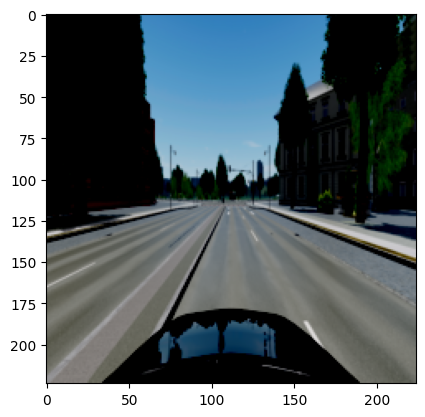

torch.Size([3, 224, 224])


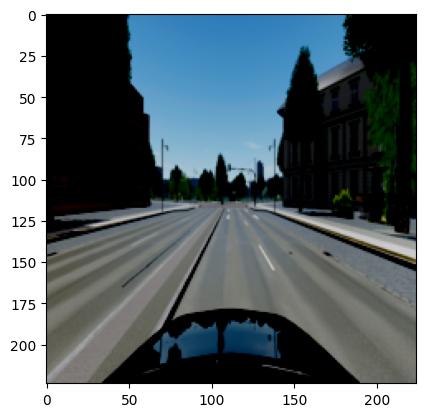

torch.Size([3, 224, 224])


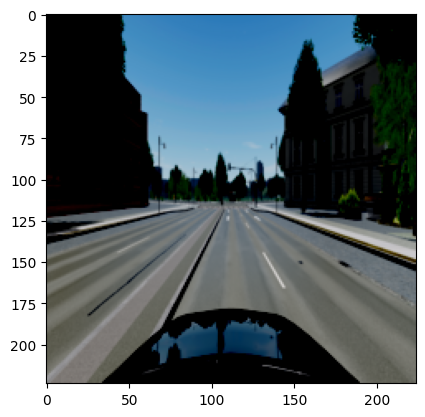

torch.Size([3, 224, 224])


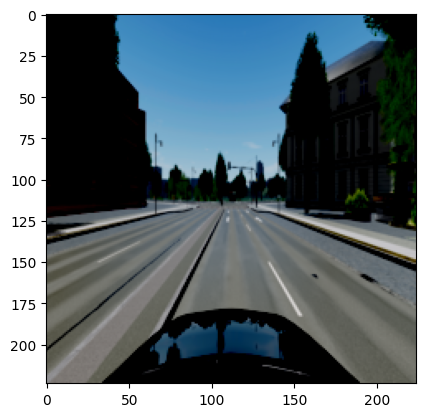

torch.Size([3, 224, 224])


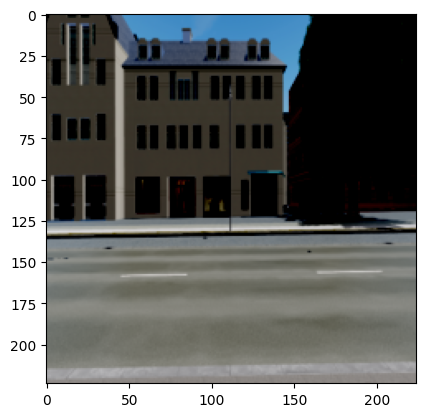

torch.Size([3, 224, 224])


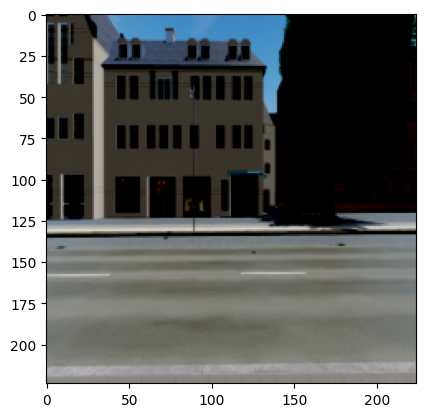

torch.Size([3, 224, 224])


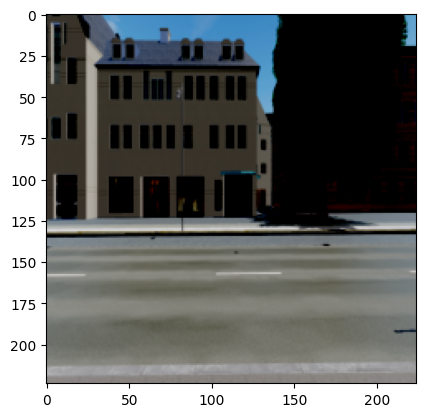

torch.Size([3, 224, 224])


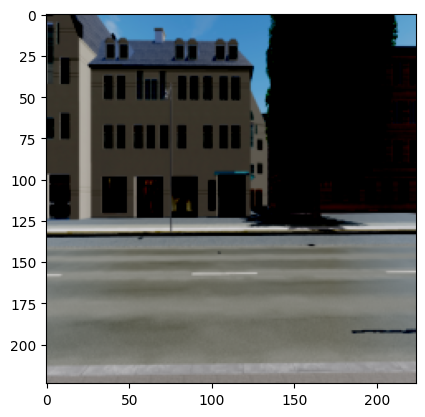

torch.Size([3, 224, 224])


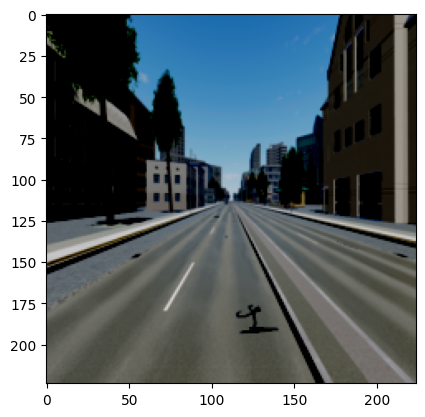

torch.Size([3, 224, 224])


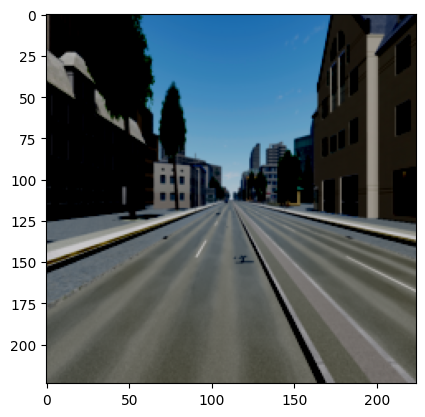

torch.Size([3, 224, 224])


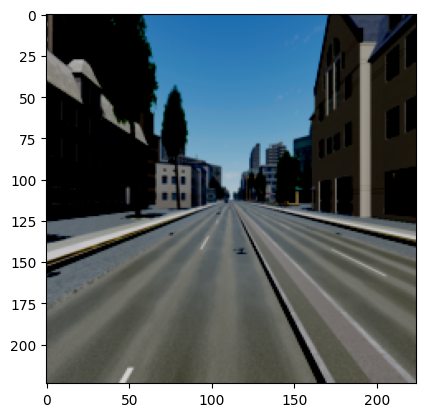

torch.Size([3, 224, 224])


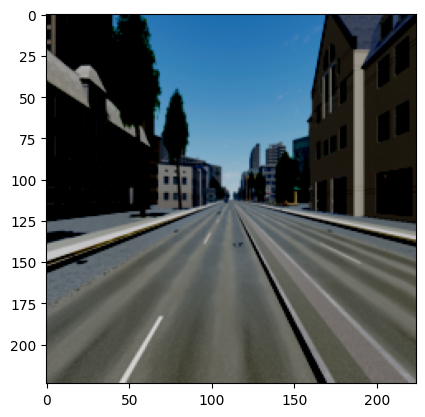

torch.Size([3, 224, 224])


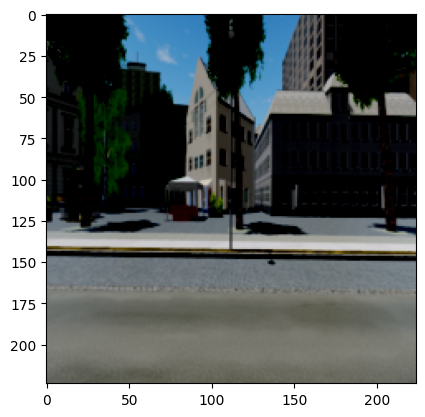

torch.Size([3, 224, 224])


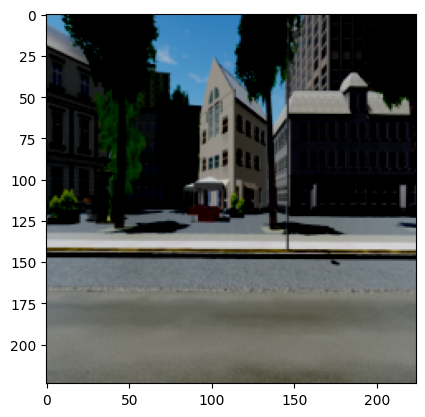

torch.Size([3, 224, 224])


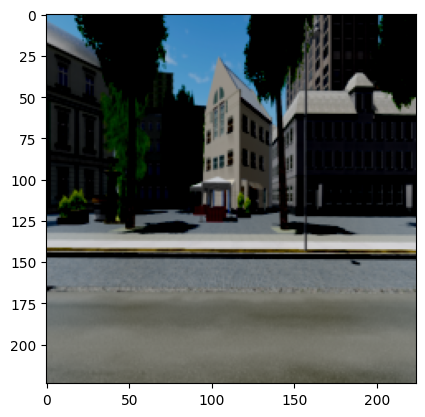

torch.Size([3, 224, 224])


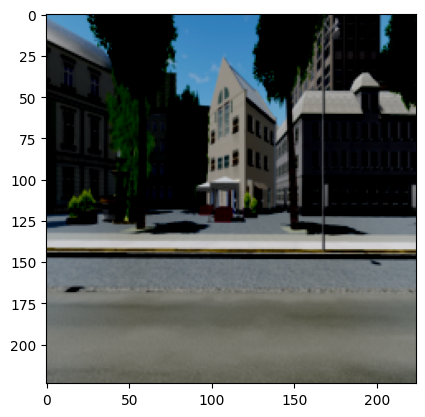

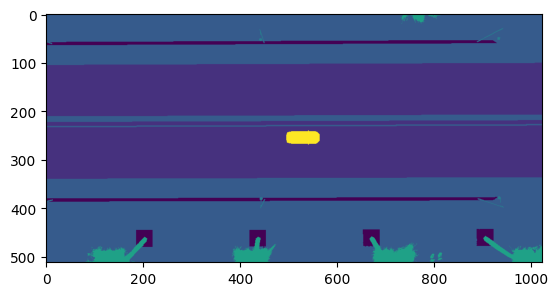

Data: [[tensor([12.3759], dtype=torch.float64), tensor([-3.9923], dtype=torch.float64)], [tensor([11.4850], dtype=torch.float64), tensor([-2.2016], dtype=torch.float64)], [tensor([11.2777], dtype=torch.float64), tensor([-1.9861], dtype=torch.float64)], [tensor([11.0887], dtype=torch.float64), tensor([-1.8615], dtype=torch.float64)]]


In [ ]:
def visualize_data(images, labels, data):

    for img1 in images:
            image=img1.squeeze()
            print(image.shape)
            image = image.permute(1, 2, 0)
            plt.imshow(image)
            plt.show()

    for label in labels:
        plt.imshow(label.squeeze())
        plt.show()

    print(f"Data: {data}")

images, labels, data = next(iter(train_dataloader))
visualize_data(images, labels, data)

# 4. Import the camera Parameters from the camera config file

## Reading Yaml camera config files

In [ ]:
import yaml

## Front camera

# Read YAML file
with open('/content/drive/MyDrive/Transformers/Data/camera_configs/front.yaml', 'r') as front_config:
    yaml_data = yaml.safe_load(front_config)

# Extract camera calibration matrix K
K1 = {
    'fx1': yaml_data['fx'],
    'fy1': yaml_data['fy'],
    'px1': yaml_data['px'],
    'py1': yaml_data['py']
}

# Extract rotation matrix R (convert angles from degrees to radians)
R1 = {
    'yaw1': yaml_data['yaw'] * (3.14159 / 180.0),
    'pitch1': yaml_data['pitch'] * (3.14159 / 180.0),
    'roll1': yaml_data['roll'] * (3.14159 / 180.0)
}

# Extract vehicle coordinates of camera origin
camera_origin1 = {
    'XCam1': yaml_data['XCam'],
    'YCam1': yaml_data['YCam'],
    'ZCam1': yaml_data['ZCam']
}

# Print the extracted data
print("Camera Calibration Matrix K1:")
print(K1)
print()
print("Rotation Matrix R1 (in radians):")
print(R1)
print()
print("Vehicle Coordinates of Camera Origin1:")
print(camera_origin1)

## left camera

# Read YAML file
with open('/content/drive/MyDrive/Transformers/Data/camera_configs/left.yaml', 'r') as left_config:
    yaml_data = yaml.safe_load(left_config)

# Extract camera calibration matrix K
K2 = {
    'fx2': yaml_data['fx'],
    'fy2': yaml_data['fy'],
    'px2': yaml_data['px'],
    'py2': yaml_data['py']
}

# Extract rotation matrix R (convert angles from degrees to radians)
R2 = {
    'yaw2': yaml_data['yaw'] * (3.14159 / 180.0),
    'pitch2': yaml_data['pitch'] * (3.14159 / 180.0),
    'roll2': yaml_data['roll'] * (3.14159 / 180.0)
}

# Extract vehicle coordinates of camera origin
camera_origin2 = {
    'XCam2': yaml_data['XCam'],
    'YCam2': yaml_data['YCam'],
    'ZCam2': yaml_data['ZCam']
}

# Print the extracted data
print("Camera Calibration Matrix K2:")
print(K2)
print()
print("Rotation Matrix R2 (in radians):")
print(R2)
print()
print("Vehicle Coordinates of Camera Origin2:")
print(camera_origin2)

## Rear Camera

# Read YAML file
with open('/content/drive/MyDrive/Transformers/Data/camera_configs/rear.yaml', 'r') as rear_config:
    yaml_data = yaml.safe_load(rear_config)

# Extract camera calibration matrix K
K3 = {
    'fx3': yaml_data['fx'],
    'fy3': yaml_data['fy'],
    'px3': yaml_data['px'],
    'py3': yaml_data['py']
}

# Extract rotation matrix R (convert angles from degrees to radians)
R3 = {
    'yaw3': yaml_data['yaw'] * (3.14159 / 180.0),
    'pitch3': yaml_data['pitch'] * (3.14159 / 180.0),
    'roll3': yaml_data['roll'] * (3.14159 / 180.0)
}

# Extract vehicle coordinates of camera origin
camera_origin3 = {
    'XCam3': yaml_data['XCam'],
    'YCam3': yaml_data['YCam'],
    'ZCam3': yaml_data['ZCam']
}

# Print the extracted data
print("Camera Calibration Matrix K3:")
print(K3)
print()
print("Rotation Matrix R3 (in radians):")
print(R3)
print()
print("Vehicle Coordinates of Camera Origin3:")
print(camera_origin3)

## Right camera

# Read YAML file
with open('/content/drive/MyDrive/Transformers/Data/camera_configs/front.yaml', 'r') as right_config:
    yaml_data = yaml.safe_load(right_config)

# Extract camera calibration matrix K
K4 = {
    'fx4': yaml_data['fx'],
    'fy4': yaml_data['fy'],
    'px4': yaml_data['px'],
    'py4': yaml_data['py']
}

# Extract rotation matrix R (convert angles from degrees to radians)
R4 = {
    'yaw4': yaml_data['yaw'] * (3.14159 / 180.0),
    'pitch4': yaml_data['pitch'] * (3.14159 / 180.0),
    'roll4': yaml_data['roll'] * (3.14159 / 180.0)
}

# Extract vehicle coordinates of camera origin
camera_origin4 = {
    'XCam4': yaml_data['XCam'],
    'YCam4': yaml_data['YCam'],
    'ZCam4': yaml_data['ZCam']
}

# Print the extracted data
print("Camera Calibration Matrix K4:")
print(K4)
print()
print("Rotation Matrix R4 (in radians):")
print(R4)
print()
print("Vehicle Coordinates of Camera Origin4:")
print(camera_origin4)

Camera Calibration Matrix K1:
{'fx1': 365, 'fy1': 429, 'px1': 512, 'py1': 256}

Rotation Matrix R1 (in radians):
{'yaw1': 0.0, 'pitch1': 0.0, 'roll1': 0.0}

Vehicle Coordinates of Camera Origin1:
{'XCam1': 1.7, 'YCam1': 0.0, 'ZCam1': 1.4}
Camera Calibration Matrix K2:
{'fx2': 365, 'fy2': 429, 'px2': 512, 'py2': 256}

Rotation Matrix R2 (in radians):
{'yaw2': 1.570795, 'pitch2': 0.0, 'roll2': 0.0}

Vehicle Coordinates of Camera Origin2:
{'XCam2': 0.5, 'YCam2': 0.5, 'ZCam2': 1.5}
Camera Calibration Matrix K3:
{'fx3': 365, 'fy3': 429, 'px3': 512, 'py3': 256}

Rotation Matrix R3 (in radians):
{'yaw3': 3.14159, 'pitch3': 0.0, 'roll3': 0.0}

Vehicle Coordinates of Camera Origin3:
{'XCam3': -0.6, 'YCam3': 0.0, 'ZCam3': 1.4}
Camera Calibration Matrix K4:
{'fx4': 365, 'fy4': 429, 'px4': 512, 'py4': 256}

Rotation Matrix R4 (in radians):
{'yaw4': 0.0, 'pitch4': 0.0, 'roll4': 0.0}

Vehicle Coordinates of Camera Origin4:
{'XCam4': 1.7, 'YCam4': 0.0, 'ZCam4': 1.4}


## Camera Intrinsic Matrices

In [ ]:
camera_matrix1 = np.array([[K1["fx1"], 0, K1["px1"]],
                          [0, K1["fy1"], K1["py1"]],
                          [0, 0, 1]])
distortion_coeffs1 = np.array([0,0,0,0,0])#[k1, k2, p1, p2, k3])
camera_matrix2 = np.array([[K2["fx2"], 0, K2["px2"]],
                          [0, K2["fy2"], K2["py2"]],
                          [0, 0, 1]])
distortion_coeffs2 = np.array([0,0,0,0,0])#[k1, k2, p1, p2, k3])
camera_matrix3 = np.array([[K3["fx3"], 0, K3["px3"]],
                          [0, K3["fy3"], K3["py3"]],
                          [0, 0, 1]])
distortion_coeffs3 = np.array([0,0,0,0,0])#[k1, k2, p1, p2, k3])
camera_matrix4 = np.array([[K4["fx4"], 0, K4["px4"]],
                          [0, K4["fy4"], K4["py4"]],
                          [0, 0, 1]])
distortion_coeffs4 = np.array([0,0,0,0,0])#[k1, k2, p1, p2, k3])
camera_matrix=[camera_matrix1,camera_matrix2,camera_matrix3,camera_matrix4]


## Camera Extrensics

In [ ]:
import numpy as np
from math import cos, sin


def rotation_matrix(roll, pitch, yaw):
    """Compute the rotation matrix from roll, pitch, and yaw angles.

    Args:
        roll (float): Roll angle in radians.
        pitch (float): Pitch angle in radians.
        yaw (float): Yaw angle in radians.

    Returns:
        numpy.ndarray: 3x3 rotation matrix.
    """
    # Compute trigonometric values
    cos_roll = cos(roll)
    sin_roll = sin(roll)
    cos_pitch = cos(pitch)
    sin_pitch = sin(pitch)
    cos_yaw = cos(yaw)
    sin_yaw = sin(yaw)

    # Compute rotation matrix elements
    R11 = cos_yaw * cos_pitch
    R12 = cos_yaw * sin_pitch * sin_roll - sin_yaw * cos_roll
    R13 = cos_yaw * sin_pitch * cos_roll + sin_yaw * sin_roll
    R21 = sin_yaw * cos_pitch
    R22 = sin_yaw * sin_pitch * sin_roll + cos_yaw * cos_roll
    R23 = sin_yaw * sin_pitch * cos_roll - cos_yaw * sin_roll
    R31 = -sin_pitch
    R32 = cos_pitch * sin_roll
    R33 = cos_pitch * cos_roll

    # Construct rotation matrix
    rotation_matrix = np.array([[R11, R12, R13],
                                [R21, R22, R23],
                                [R31, R32, R33]])

    return rotation_matrix
rotation_matrix1=rotation_matrix(R1["roll1"],R1["pitch1"],R1["yaw1"])
rotation_matrix2=rotation_matrix(R2["roll2"],R2["pitch2"],R2["yaw2"])
rotation_matrix3=rotation_matrix(R3["roll3"],R3["pitch3"],R3["yaw3"])
rotation_matrix4=rotation_matrix(R4["roll4"],R4["pitch4"],R4["yaw4"])
rotation_matrix=[rotation_matrix1,rotation_matrix2,rotation_matrix3,rotation_matrix4]

In [ ]:
# Translation Matrices
translation_vector1 = np.array([camera_origin1["XCam1"],camera_origin1["YCam1"],camera_origin1["ZCam1"]])
translation_vector2 = np.array([camera_origin2["XCam2"],camera_origin2["YCam2"],camera_origin2["ZCam2"]])
translation_vector3 = np.array([camera_origin3["XCam3"],camera_origin3["YCam3"],camera_origin3["ZCam3"]])
translation_vector4 = np.array([camera_origin4["XCam4"],camera_origin4["YCam4"],camera_origin4["ZCam4"]])
translation_vector=[translation_vector1,translation_vector2,translation_vector3,translation_vector4]

In [ ]:
def transformation_matrix(rotation_matrix_, translation_vector_):
    transformation_matrix_ = []
    for i in range(4):
        transformation_matrix_single = np.column_stack((rotation_matrix_[i], translation_vector_[i]))
        fourth_row = np.array([0, 0, 0, 1])
        transformation_matrix_single = np.vstack((transformation_matrix_single, fourth_row))
        transformation_matrix_.append(torch.tensor(transformation_matrix_single, dtype=torch.float32)) # Convert to tensor
    return transformation_matrix_

transformation_matrix_cuda = transformation_matrix(rotation_matrix, translation_vector)

transformation_matrix = [matrix.to(device) for matrix in transformation_matrix_cuda]


# 5. Rectify the images : Undistort

In [ ]:
def rectify_image(image, camera_matrix, distortion_coeffs, rotation_matrix, translation_vector):
    # Load the image
    #image = cv2.imread(image_path)

    # Obtain the image size
    image_size = (image.shape[1], image.shape[0])
    new_camera_matrix, validPixROI = cv2.getOptimalNewCameraMatrix(camera_matrix, distortion_coeffs, image_size,
        1)
    # Rectify the image using the camera parameters
    rectified_image = cv2.undistort(image, camera_matrix, distortion_coeffs, None, new_camera_matrix)
    return rectified_image

# 6. Building the Backbone to generate the fearure map : ResNet50

In [ ]:
import torch.nn.functional as F

def generate_feature_map(image, feature_layer, device='cuda'):
    # Convert the image to a numpy array
    image_np = image.cpu().numpy()
    #image = rectify_image(image_np,camera_matrix1, distortion_coeffs1, rotation_matrix1, translation_vector1)
    # Load the image
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)

    # Preprocess the image
    image_np = image_np.astype(np.float32) / 255.0
    image_np = np.transpose(image_np, (2, 0, 1))  # Transpose dimensions to (channels, height, width)
    image_np = np.expand_dims(image_np, axis=0)  # Add a batch dimension

    # Create the ResNet model
    model_1 = models.resnet50(weights='ResNet50_Weights.IMAGENET1K_V1').to(device)

    # Convert the image to a PyTorch tensor and move it to the same device as the model
    image_tensor = torch.from_numpy(image_np).to(device)

    # Forward pass to obtain the feature map
    with torch.no_grad():
        features = model_1.conv1(image_tensor)
        for i in range(1, feature_layer):
            features = model_1._modules[f"layer{i}"](features)

    # Get the desired feature map
    feature_map = features.squeeze().cpu().numpy()
    #print(feature_map.shape)
    return feature_map


# 7. Develop the Positional Embeddings from the camera parameters

In [ ]:
import torch.nn.functional as F
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.lin1 = nn.Linear(input_dim, 2048)
        self.actv = nn.GELU()
        self.lin2 = nn.Linear(2048, output_dim)
        self.conv1=conv = nn.Conv2d(in_channels=input_dim, out_channels=1, kernel_size=1)

    def forward(self, x):
        device = self.lin1.weight.device
        x = self.lin1(x.to(device))
        x = self.actv(x)
        x = self.lin2(x)
        return x

    def forward1(self, x):
        device = self.lin1.weight.device
        x = self.lin1(x.to(device))
        x = F.relu(x)
        x = self.lin2(x)
        return x

    def forward2(self,x):
        #x = torch.from_numpy(x)
        device = self.conv1.weight.device
        x = self.conv1(x.to(device))
        return x

    #def GELU(input):
     #   return 0.5*input*(1+math.tanh((np.sqrt(2/math.pi)*(input+0.044715*(input)**3))))



# 8. Develop the 3D Positional Encodings from the camera parameters

In [ ]:
import numpy as np

def position_encodings_3d(transformation_matrix, image):
    xmin = 0
    xmax = 150
    ymin = 0
    ymax = 50
    zmin = 0
    zmax = 15
    # Generate the meshgrid of camera frustum space
    wf = image.shape[1]
    hf = image.shape[2]
    d = np.arange(0,150,150)  # Adjust the range based on your needs
    uu, vv, dd = np.meshgrid(np.arange(wf), np.arange(hf), d)

    # Construct the camera frustum points
    pm = np.row_stack((uu.flatten()*dd.flatten(),vv.flatten()*dd.flatten(),dd.flatten(), np.ones_like(dd.flatten())))
    # Calculate the inverse of the transformation matrix
    transformation_matrix = transformation_matrix.cpu().numpy()
    Ki = np.linalg.inv(transformation_matrix)
    Ki = torch.tensor(Ki, dtype=torch.float32)

    # Calculate the 3D coordinates in world space
    p3d = np.matmul(Ki, pm)


    # Normalize the 3D coordinates
    p3d[:, 0] = (p3d[:, 0] - xmin) / (xmax - xmin)
    p3d[:, 1] = (p3d[:, 1] - ymin) / (ymax - ymin)
    p3d[:, 2] = (p3d[:, 2] - zmin) / (zmax - zmin)

    # Reshape the 3D coordinates as required
    p3d = p3d.reshape(d.shape[0], hf, wf, 4)
    return p3d

#Now try to take in the feature map and pass it through the 1*1 convolution, #print(p3d.shape) #whenever change the depth, ensure this parameter is set properly to match matrices for the multiplication


In [ ]:
class PELR_generation(nn.Module):
    def __init__(self):
        super(PELR_generation, self).__init__()
        self.MLP = MLP(1*224*224*4,196)
        self.feat_map=MLP(2048,1)
        self.position_aware_feature_3d = torch.tensor([], dtype=torch.float32)

    def feature_maps(self, images, transformation_matrix):
        position_aware_feature_3d = torch.tensor([], dtype=torch.float32)
        feature_layer = 5  # Specify the desired feature layer (between 1 and 5 for ResNet-50)
        idx=0

        images = list(torch.unbind(images, dim=0))# Changes have been made to make it run on the gpu

        for idx1,img in enumerate(images):
            if idx1 < 4:
                idx = 0
            elif 3 < idx1 < 8:
                idx = 1
            elif 7 < idx1 < 12:
                idx = 2
            elif 11 < idx1 < 16:
                idx = 3
            else:
                raise ValueError("Invalid index")

            image=img.squeeze()

            image=torch.permute(image,(1,2,0))
            #image_np = image.numpy()  # Convert the tensor to a NumPy array
            #image_np = image_np.astype(np.uint8)
            feature_map=generate_feature_map(image, feature_layer)
            image=torch.permute(image,(2,0,1))
            p3d=position_encodings_3d(transformation_matrix[idx], image)
            #print(p3d.shape)
            p3d = torch.tensor(np.squeeze(p3d.reshape(-1, 1)),dtype=torch.float32)
            #print(p3d.shape) #whenever change the depth, ensure this parameter is set properly to match matrices for the multiplication
            out=self.MLP.forward1(p3d)
            feature_map_=torch.tensor(feature_map,dtype=torch.float32)
            out1=self.feat_map.forward2(feature_map_)
            out1=out1.squeeze(0)
            out1=out1.reshape(-1)
            position_aware_feature_3d1=torch.add(out,out1) #out1
            position_aware_feature_3d = torch.cat((position_aware_feature_3d.to(device), position_aware_feature_3d1.to(device)), dim=0)

        return position_aware_feature_3d

# 9. Generate the query vector from the segmented image outputs

In [ ]:
# class generate_query(nn.Module):
#     def __init__(self, input_dim, output_dim, h_bev, w_bev):
#         super(generate_query, self).__init__()
#         self.linear = nn.Linear(input_dim, output_dim)
#         self.MLP1 = MLP(50*150*3,196)
#         self.h_bev=h_bev
#         self.w_bev=w_bev

#     def generate_bev_query_grid(self):
#         Q = torch.zeros((self.h_bev, self.w_bev, 3), device=device)
#         for i in range(self.h_bev):
#             for j in range(self.w_bev):
#                 j_normalized = (2 * j) / (self.w_bev - 1) - 1
#                 i_normalized = (2 * i) / (self.h_bev - 1) - 1
#                 Q_radial = torch.sqrt(torch.tensor(j_normalized) ** 2 + torch.tensor(i_normalized) ** 2)
#                 Q[i, j] = torch.tensor([ i_normalized,j_normalized,Q_radial], device=device)
#         return Q

#     def forward(self, flattened_feature_map):
#         x = self.linear(flattened_feature_map)
#         x= F.relu(x)
#         x=x.to(device)
#         Q_bev_query_grid = self.generate_bev_query_grid()
#         Q_bev_query_grid=Q_bev_query_grid.view(1,-1)
#         Q_bev_query_grid = Q_bev_query_grid.to(device)
#         #print(Q_bev_query_grid.shape)
#         BEV_PE=self.MLP1.forward(Q_bev_query_grid)
#         BEV_query=torch.add(x,BEV_PE)
#         BEV_query=BEV_query.to(device)
#         return BEV_query




In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class generate_query(nn.Module):
    def __init__(self, input_dim, output_dim, h_bev, w_bev):
        super(generate_query, self).__init__()

        # Learnable BEV queries (initialized with labels during training)
        self.learned_queries = nn.Parameter(torch.randn(1, output_dim, dtype=torch.float32, device=device))

        # Projection layer to initialize queries from labels (used only during training)
        self.linear = nn.Linear(input_dim, output_dim)

        # BEV Positional Encoding
        self.MLP1 = MLP(h_bev * w_bev * 3, output_dim)  # Keep consistent with previous working code

        self.h_bev = h_bev
        self.w_bev = w_bev
        self.initialized = False  # Track initialization

    def generate_bev_query_grid(self):
        """Generates spatial positional encodings for BEV queries."""
        Q = torch.zeros((self.h_bev, self.w_bev, 3), dtype=torch.float32, device=device)
        for i in range(self.h_bev):
            for j in range(self.w_bev):
                j_normalized = torch.tensor((2 * j) / (self.w_bev - 1) - 1, dtype=torch.float32, device=device)
                i_normalized = torch.tensor((2 * i) / (self.h_bev - 1) - 1, dtype=torch.float32, device=device)
                Q_radial = torch.sqrt(j_normalized ** 2 + i_normalized ** 2)
                Q[i, j] = torch.stack([i_normalized, j_normalized, Q_radial])  # Ensure proper stacking
        return Q

    def forward(self, flattened_feature_map=None):
        """Generates BEV queries. Uses labels during training, learned queries during inference."""
        Q_bev_query_grid = self.generate_bev_query_grid().view(1, -1).to(device)  # Ensure correct shape
        BEV_PE = self.MLP1(Q_bev_query_grid)  # Ensure MLP1 is compatible

        if self.training and flattened_feature_map is not None:
            # Convert labels to float32 before passing to Linear layer
            flattened_feature_map = flattened_feature_map.to(dtype=torch.float32, device=device)

            # Fix: Ensure the input to `linear()` has the correct shape
            flattened_feature_map = flattened_feature_map.view(1, -1)  # Ensure shape [1, 524288]

            # Training: Initialize queries from labels
            x = self.linear(flattened_feature_map)
            x = F.relu(x)

            # Initialize learned queries with labels during the first forward pass
            if not self.initialized:
                self.learned_queries.data = x.clone().detach()
                self.initialized = True  # Mark initialization

            # Smoothly blend learned queries with labels to enable gradual adaptation
            alpha = 0.1  # Weight for blending new updates
            self.learned_queries.data = (1 - alpha) * self.learned_queries.data + alpha * x.clone().detach()

        # Ensure `BEV_query` maintains correct dimensionality
        BEV_query = self.learned_queries + BEV_PE  # Element-wise addition
        return BEV_query.to(device)  # Ensure correct device


# 10. Build the Transformer architecture with Encoder having the self attention, and Ddeocder having the cross attention

In [ ]:
class FeedForwardBlock(nn.Module):
    def __init__(self, emb_size: int, expansion: int = 4, drop_p: float = 0.):
        super().__init__()
        self.nn1 = nn.Linear(emb_size, expansion * emb_size)
        self.actv11 = nn.GELU()
        self.drp = nn.Dropout(drop_p)
        self.nn2 = nn.Linear(expansion * emb_size, emb_size)

    def forward(self, x):
        x = self.drp(self.actv11(self.nn1(x)))
        x = self.nn2(x)
        return x


In [ ]:
class TransformerBlock1(nn.Module):
    def __init__(self, emb_size: int = 196, drop_p: float = 0., forward_expansion: int = 4, forward_drop_p: float = 0., **kwargs):
        super().__init__()
        self.nna = nn.LayerNorm(emb_size)
        self.attention = nn.MultiheadAttention(emb_size, num_heads=14)
        self.nnd = nn.Dropout(drop_p)
        self.mlp = FeedForwardBlock(emb_size, expansion=forward_expansion, drop_p=forward_drop_p)

    def forward(self, projected_query, projected_feature):
        key = self.nna(projected_feature)
        #print("main_encd")
        x, attn_output_weights = self.attention(key, key, key)
        x1 = x + key
        x = self.nna(x1)
        x = self.nnd(self.mlp(x))
        x = x + x1
        return x


In [ ]:
class TransformerBlock2(nn.Module):
    def __init__(self, emb_size: int = 196, drop_p: float = 0., forward_expansion: int = 4, forward_drop_p: float = 0., **kwargs):
        super().__init__()
        self.nna = nn.LayerNorm(emb_size)
        self.attention = nn.MultiheadAttention(emb_size, num_heads=14)
        self.nnd = nn.Dropout(drop_p)
        self.mlp = FeedForwardBlock(emb_size, expansion=forward_expansion, drop_p=forward_drop_p)

    def forward(self, projected_query, projected_feature):
        query = self.nna(projected_query)
        key = self.nna(projected_feature)
        #print("main_dcd")
        x, attn_output_weights1 = self.attention(query, key, key)
        x1 = x + query
        x = self.nna(x1)
        x = self.nnd(self.mlp(x))
        x = x + x1
        return x


In [ ]:
class TransformerEncoder(nn.Module):
    def __init__(self, depth, **kwargs):
        super().__init__()
        self.depth=depth
        self.block=TransformerBlock1()
    def forward(self, key, query):
        out1=key
        for i in range(self.depth):
            tmp=self.block(query, out1)
            out1=tmp
            #print("Temp_encd")
        return out1


In [ ]:
class TransformerDecoder(nn.Module):
    def __init__(self, depth , **kwargs):
        super().__init__()
        self.depth=depth
        self.block=TransformerBlock2()
    def forward(self,key, query):
        out=query
        for i in range(self.depth):
            tmp1=self.block(out, key)
            out=tmp1
            #print("Temp_dcd")
        return out


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Transformer(nn.Module):
    def __init__(self, key_dim, query_dim, feature_dim):
        super(Transformer, self).__init__()
        self.emb_size = feature_dim
        self.drop_p = 0.
        self.forward_expansion = 4
        self.forward_drop_p = 0.
        self.encoder_depth = Number_of_Encoder_F
        self.encoder_depth_BEV=Number_of_Encoder_BEV
        self.decoder_depth = Number_of_Decoder_F

        self.query_dim = query_dim
        self.feature_dim = feature_dim

        self.query_proj = nn.Linear(query_dim, feature_dim)
        self.feature_proj = nn.Linear(key_dim, feature_dim)
        self.Encoder_Features = TransformerEncoder(depth=self.encoder_depth, emb_size=self.emb_size)
        self.Encoder_BEV = TransformerEncoder(depth=self.encoder_depth_BEV, emb_size=self.emb_size)
        self.Decoder_Features = TransformerDecoder(depth=self.decoder_depth, emb_size=self.emb_size)

    def forward(self, feature_map, query):

        # Project the query, feature map, ray embeddings, and positional embeddings
        projected_query = self.query_proj(query)
        projected_feature = self.feature_proj(feature_map)
        #print(projected_feature.shape, projected_query.shape)

        # Encoder: self-attention among the keys/input features
        key_new = self.Encoder_Features(projected_feature, projected_query)
        query_new=self.Encoder_BEV(projected_query, projected_query)


        # Decoder: cross-attention between the keys/encoder outputs and queries/outputs
        output = self.Decoder_Features(key_new, query_new)
        #print(output)
        #print(output.shape)

        return output


In [ ]:
class generate_output(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(generate_output, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim)
        self.conv1 = nn.ConvTranspose2d(1, 60, 3, 1)
        self.conv2 = nn.Conv2d(60, 9, 3, 1)

    def forward(self, x):
        x = self.linear(x)
        x = x.reshape(1, 512, 1024)
        #print("C")
        x = self.conv2(F.relu(self.conv1(x)))
        #print("D")
        x = F.softmax(x, dim=1)
        #print("E")

        return x




# 11. Generate the architecture for the model

In [ ]:
# class Pipeline(nn.Module):
#     def __init__(self):
#         super(Pipeline, self).__init__()
#         self.input_dim = 512*1024  # Input dimension of the flattened feature map
#         self.output_dim = 196  # Output dimension of the query vector
#         self.input_dim1 = 196  # Input dimension of the flattened feature map
#         self.output_dim1 = 512*1024  # Output dimension of the query vector
#         self.PELR_generation=PELR_generation()
#         self.decoder=generate_query(self.input_dim, self.output_dim, 50, 150)
#         self.model1=Transformer(3136, 196, 196)
#         self.segmentation_head=generate_output(self.input_dim1, self.output_dim1)
#     def forward(self, images, labels, transformation_matrix):
#         #labels = torch.unbind(labels, dim=0)
#         key_generator=self.PELR_generation
#         #print(position_aware_feature_3d.shape)
#         position_aware_feature_3d=key_generator.feature_maps(images, transformation_matrix)
#         labels=labels.squeeze()
#         labels=labels.reshape(-1)
#         labels = torch.tensor(labels,dtype=torch.float32)

#         # Flatten the segmented image
#         # Create the Decoder module
#         decoder =self.decoder # generate_query(self.input_dim, self.output_dim)

#         # Generate the query vector
#         query_vector = decoder.forward(labels)

#         key_vector=position_aware_feature_3d
#         value_vector=position_aware_feature_3d
#         query_vector=query_vector

#         model1 = self.model1 #CrossAttention(3136, 196, 196)

#         key_vector = key_vector.to(device)
#         query_vector = query_vector.to(device)

#         key_vector = key_vector.view(1,-1)
#         query_vector = query_vector.view(1,-1)
#         print(key_vector.shape,query_vector.shape)
#         output1 = model1.forward(key_vector,query_vector)


#         # Flatten the segmented image
#         flattened_feature_map1 =output1# torch.tensor(output1, dtype=torch.float32)

#         # Create the Decoder module
#         segmentation_head = self.segmentation_head#generate_output(self.input_dim1, self.output_dim1)

#         # Generate the query vector
#         segmentation_output = segmentation_head(flattened_feature_map1)

#         return segmentation_output




In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class Pipeline(nn.Module):
    def __init__(self):
        super(Pipeline, self).__init__()
        self.input_dim = 512 * 1024  # Input dimension of the flattened feature map
        self.output_dim = 196  # Output dimension of the query vector

        self.PELR_generation = PELR_generation()  # Feature map generation
        self.decoder = generate_query(self.input_dim, self.output_dim, 50, 150)  # Query generator
        self.model1 = Transformer(3136, 196, 196)  # Transformer for attention
        self.segmentation_head = generate_output(self.output_dim, self.input_dim)  # BEV segmentation

    def forward(self, images, labels=None, transformation_matrix=None):
        """
        Forward pass for BEV perception.
        - Training: Uses `labels` to initialize queries.
        - Inference: Uses learned BEV queries.
        """
        # Step 1: Generate position-aware feature maps
        key_vector = self.PELR_generation.feature_maps(images, transformation_matrix).to(device)

        # Step 2: Generate queries (labels in training, learned queries in inference)
        query_vector = self.decoder(labels if self.training and labels is not None else None)

        # Step 3: Transformer cross-attention between feature maps (keys) and queries
        key_vector = key_vector.view(1, -1).to(device)
        query_vector = query_vector.view(1, -1).to(device)
        output1 = self.model1(key_vector, query_vector)

        # Step 4: Decode transformer output into semantic BEV segmentation
        segmentation_output = self.segmentation_head(output1)
        return segmentation_output


In [ ]:
def convert_to_one_hot(segmentation_map, num_classes):
    segmentation_map=segmentation_map.squeeze()
    height, width = segmentation_map.shape
    one_hot_vector = np.zeros((height, width, num_classes), dtype=np.uint8)

    for h in range(height):
        for w in range(width):
            class_label = segmentation_map[h, w]
            one_hot_vector[h, w, class_label] = 1

    return one_hot_vector


In [ ]:
# %mkdir -p models

In [ ]:
class FocalLoss(nn.modules.loss._WeightedLoss):
    def __init__(self, weight=None, gamma=2,reduction='mean'):
        super(FocalLoss, self).__init__(weight,reduction=reduction)
        self.gamma = gamma
        self.weight = weight #weight parameter will act as the alpha parameter to balance class weights

    def forward(self, input, target):

        ce_loss = F.cross_entropy(input, target,reduction=self.reduction,weight=self.weight)
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma * ce_loss).mean()
        return focal_loss

# 12. Develop the training pipeline

In [ ]:
# # Define model
# model = Pipeline()
# # Define the loss function and optimizer
# #criterion = nn.CrossEntropyLoss()
# criterion = FocalLoss()
# optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# model.to(device)

# Move model to GPU before defining optimizer
model = Pipeline().to(device)

# Define the loss function
criterion = FocalLoss()  # Ensure this is properly implemented

# Define optimizer after moving model to GPU
optimizer = optim.Adam(model.parameters(), lr=learning_rate)


In [ ]:

# Lets add the trained model here as base just to demonstrate

In [ ]:
# model.load_state_dict(torch.load("/home/jovyan/acdc/topics/04-Time-Series-Inverse-Perspective-Mapping/Models/model_final_v46_121206_dynamic_0609_87.pth"))


In [ ]:
for epoch in range(num_epochs):
    # Training
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    i=0

    for images1, labels1, _ in train_dataloader:

        images1 = torch.stack(images1)
        labels1 = torch.stack(labels1)

        images1 = images1.to(device)

        labels1 = labels1.to(device)



        optimizer.zero_grad()

        outputs = model.forward(images1, labels1, transformation_matrix)
        print(outputs.shape)


        label=convert_to_one_hot(labels1[0], num_classes=9)

        label=torch.tensor(label,dtype=torch.float32)

        label=label.permute(2,0,1)
        print(label.shape)
        label = label.to(device)



        loss = criterion(outputs, label)

        loss.backward()

        optimizer.step()


        train_loss += loss.item()
        _, predicted = outputs.max(0)
        total =512*1024 # labels1[0].size(0)
        correct = torch.eq(predicted, labels1[0].view_as(predicted)).sum().item()



        train_loss /= len(train_dataloader)
        train_accuracy = 100.0 * correct / total
        print(f"Epoch: {epoch},Set_No:{i+1}, Train_Accuracy:{train_accuracy}")
        i=i+1



    # torch.save(model.state_dict(), f"/content/drive/MyDrive/Transformers/Data/model_final_v47_121206_dynamic_{epoch}.pth")

torch.save(model.state_dict(), f"/content/drive/MyDrive/Transformers/Data/model_final_v47_121206_dynamic_final.pth")



Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 187MB/s]
<ipython-input-27-3788431a46ee>:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  p3d = torch.tensor(np.squeeze(p3d.reshape(-1, 1)),dtype=torch.float32)


torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:1, Train_Accuracy:9.869956970214844
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:2, Train_Accuracy:11.22589111328125
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:3, Train_Accuracy:16.34807586669922
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:4, Train_Accuracy:26.3427734375
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:5, Train_Accuracy:40.12794494628906
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:6, Train_Accuracy:50.904083251953125
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:7, Train_Accuracy:59.15412902832031
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:8, Train_Accuracy:64.9026870727539
torch.Size([9, 512, 1024])
torch.Size([9, 512, 1024])
Epoch: 0,Set_No:9, Train_Accuracy:64.19849395751953
torch.Size([9, 512, 1024])
torch.Size([9, 512, 102

# 13. Develop the Validation Pipeline

In [ ]:
# Validation
model.eval()
valid_loss = 0.0
correct = 0
total = 0

with torch.no_grad():
          for images1, labels1,_ in valid_dataloader:

            #images=[torch.tensor(img) for img in images1]

            #labels=[torch.tensor(label) for label in labels1]
            #images = images.to(device)
        #
            #labels = labels.to(device)
            images1 = torch.stack(images1)
            labels1 = torch.stack(labels1)

            images1 = images1.to(device)

            labels1 = labels1.to(device)
            outputs = model.forward(images1, labels1, transformation_matrix)

            label=convert_to_one_hot(labels1[0], num_classes=9)
            label=torch.tensor(label,dtype=torch.float32)
            label=label.permute(2,0,1)
            label = label.to(device)

            loss = criterion(outputs, label)



            valid_loss += loss.item()
            _, predicted1 = outputs.max(0)
            total =512*1024 # labels1[0].size(0)
            correct = torch.eq(predicted1, labels1[0].view_as(predicted1)).sum().item()



            valid_loss /= len(valid_dataloader)
            valid_accuracy = 100.0 * correct / total
            print(f"Valid_Accuracy:{valid_accuracy}")


<ipython-input-27-3788431a46ee>:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  p3d = torch.tensor(np.squeeze(p3d.reshape(-1, 1)),dtype=torch.float32)


Valid_Accuracy:22.88494110107422
Valid_Accuracy:23.332977294921875
Valid_Accuracy:23.64673614501953
Valid_Accuracy:23.64349365234375
Valid_Accuracy:23.196029663085938
Valid_Accuracy:23.1292724609375
Valid_Accuracy:23.08177947998047
Valid_Accuracy:23.131179809570312


# 14.Inference

<ipython-input-43-1a460b8f622d>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(inference_model_path))
Downloading: "https://download.pytor

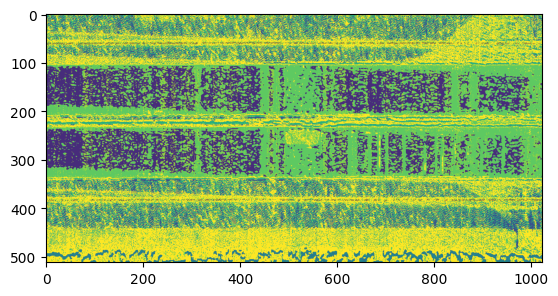

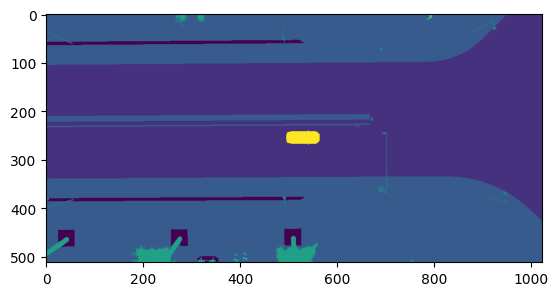

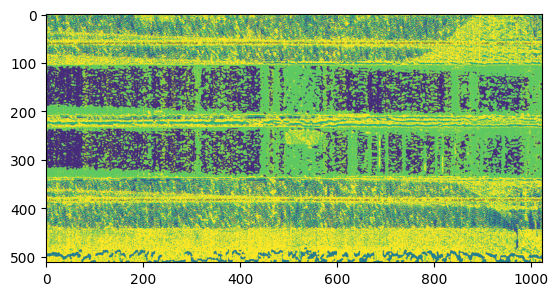

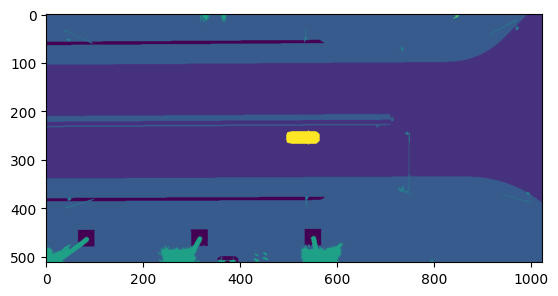

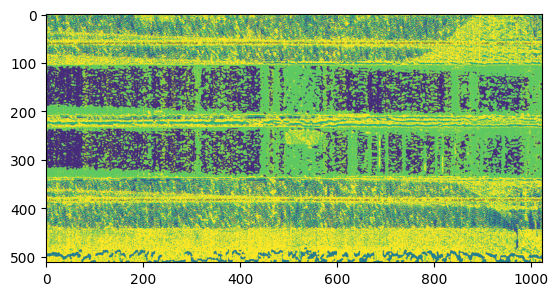

...

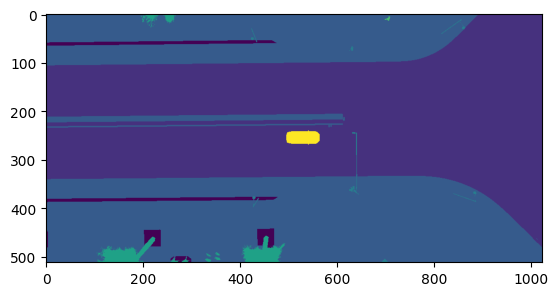

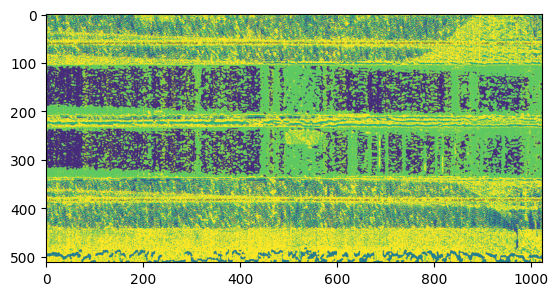

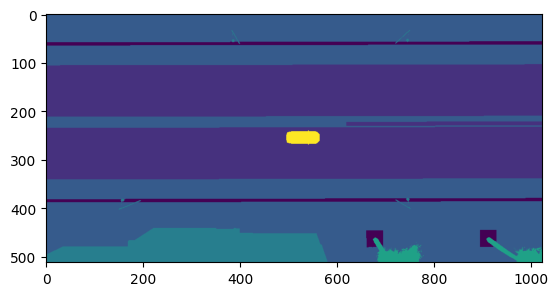

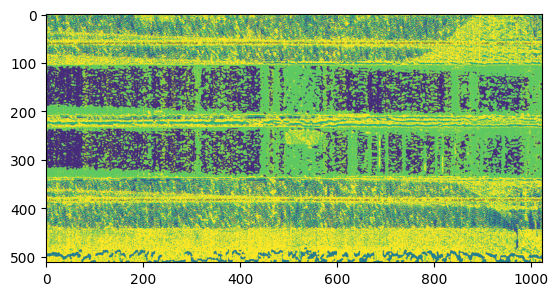

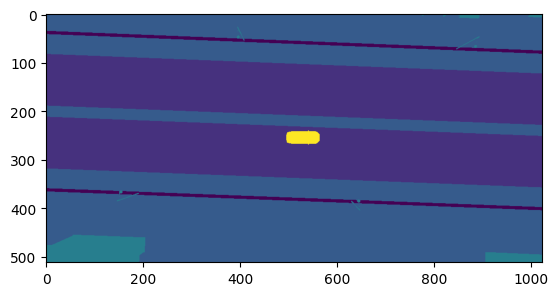

In [ ]:
model=Pipeline()
# Load the pre-trained model
# Inference

inference_model_path="/content/drive/MyDrive/Transformers/Data/model_final_v47_121206_dynamic_final.pth"
model.load_state_dict(torch.load(inference_model_path))
model.to(device)
model.eval()


with torch.no_grad():
          for images1, labels1,_ in valid_dataloader:
            images1 = torch.stack(images1)
            labels1 = torch.stack(labels1)

            images1 = images1.to(device)

            labels1 = labels1.to(device)

            outputs = model.forward(images1, labels1, transformation_matrix)


            # Obtain the predicted labels
            _, predicted1 = outputs.max(0)
            #predcited1 = predicted1.cpu().numpy() # Changes have been made to make it run on the gpu
            # Visualize the outputs
            # Transfer the tensor back to the CPU
            predicted1_cpu = predicted1.cpu()
            labels1_cpu=labels1.cpu()
            # Convert the tensor to a NumPy array
            predicted1_numpy = predicted1_cpu.numpy()
            labels1_numpy=labels1_cpu.numpy()
            plt.imshow(predicted1_numpy)
            plt.show()
            plt.imshow(labels1_numpy[0].squeeze())
            plt.show()


# 15. Visulaize the Results

In [ ]:
def segmentation_map_to_rgb_encoding(segmentation_map, rgb_to_class_id):
    """
    Converts the segmentation map into an RGB encoding

    Arguments:
    segmentation_map -- Torch tensor of shape [height, width]
    rgb_to_class_id -- Dictionary that contains the association between color and class ID

    Returns:
    rgb_encoding -- Torch tensor of shape [height, width, 3]
    """

    rgb_encoding = torch.zeros(segmentation_map.shape[0], segmentation_map.shape[1], 3, dtype=torch.uint8)

    for color, class_id in rgb_to_class_id.items():
        mask = segmentation_map == class_id
        rgb_encoding[mask] = torch.tensor(color, dtype=torch.uint8).reshape(1, 1, -1)

    return rgb_encoding




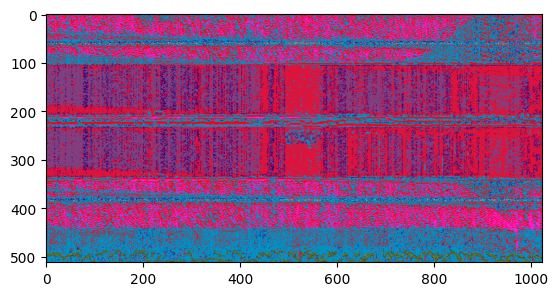

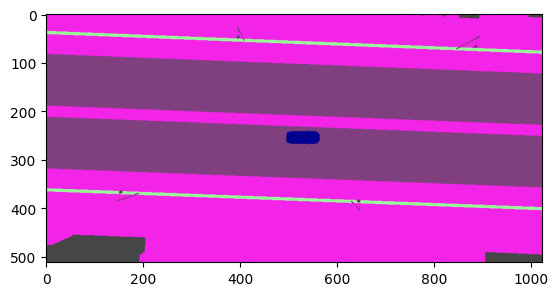

In [ ]:
output5=segmentation_map_to_rgb_encoding(predicted1, rgb_to_class_id)
plt.imshow(output5)
plt.show()
label=segmentation_map_to_rgb_encoding(labels1[0].squeeze(), rgb_to_class_id)
plt.imshow(label)
plt.show()

# 16. Evaluations: MIOU
Mean IOU: The Mean Intersection over Union (IoU) is a common metric used for evaluating the performance of image segmentation models. It measures the overlap between the predicted segmentation mask and the ground truth mask for each class in a segmented image and then calculates the average IoU across all classes.

IoU (Intersection over Union):

IoU Calculation: IoU is calculated for each class separately by dividing the intersection of the predicted and ground truth mask by their union. It quantifies how well the predicted mask aligns with the ground truth mask.

IoU = (Intersection of Predicted Mask and Ground Truth Mask) / (Union of Predicted Mask and Ground Truth Mask)

MIOU is the average IoU across all classes.

In [ ]:
def calculate_miou(predicted, ground_truth, num_classes):
    miou = 0.0
    for class_id in range(num_classes):
        class_predicted = predicted == class_id
        class_ground_truth = ground_truth == class_id
        #TP = Logical AND operation between the ground truth and prediction
        #FP = Logical OR operation between the ground truth and prediction, minus ground truth
        #FN = Logical OR operation between the ground truth and prediction, minus prediction
        TP = torch.sum(class_predicted & class_ground_truth).item()
        FP = torch.sum(class_predicted & ~class_ground_truth).item()
        FN = torch.sum(~class_predicted & class_ground_truth).item()

        intersection = TP
        union = TP + FP + FN

        if union > 0:
            miou += intersection / union
            tmp2=intersection / union
        print(f"class {class_id} IOU={tmp2*100}")

    miou /= num_classes
    return miou


In [ ]:
MIOU=calculate_miou(predicted1, labels1[0].squeeze(), num_classes=9)
print(f"Mean IOU = {MIOU*100}")

class 0 IOU=1.5845437486969212
class 1 IOU=36.61623313014452
class 2 IOU=14.14197756753012
class 3 IOU=8.119225037257824
class 4 IOU=0.0
class 5 IOU=0.0
class 6 IOU=0.0
class 7 IOU=0.6802267422474157
class 8 IOU=0.0
Mean IOU = 6.793578469541867


# 17.Results and Discussions

### 1. Static Dataset

when trained V40 on 100 data elements(0.8:0.2) of the static dataset. It gives the mIOU as 15.15552. Here, It seems there is a class imbalance, and it achieves the maximum IOU for the road to be 71% and sidewalk as 40% and cars as 15%, whereas other classes , it is negligible.

0: terrain/ground = 6.314914831740756

1: road = 71.73517788318345

2: sidewalk/parking = 40.930115305361916

3: building/wall/fence/pole/obstacle/... = 0.288068600522543

4: vegetation = 4.641845011238152

5: person = 0.0

6: rider/motorcycle/bicycle = 0.0

7: car/truck/bus/van = 12.48680599535571

8: sky = 0.0

Mean IOU = 15.155214180822504,

if we ignore the classes(5 classes) for which IOU is less than 5%, we get the Mean IOU as 34.09923190685063.

### 2. Dynamic Dataset
when trained V41 on 100 data elements(0.8:0.2) of the dynamic dataset using model trained in V40 for 13 epochs, it gives the mIOU as 15.5029. Here, It seems there is a class imbalance, and it achieves the maximum IOU for the road to be 65.9619% and sidewalk as 44.70945% and buildings as 15%, whereas other classes , it is negligible.

0: terrain/ground = 6.425628727787001

1: road = 65.96194118182646

2: sidewalk/parking = 44.709457520373945

3: building/wall/fence/pole/obstacle/... = 15.337198829092547

4: vegetation = 4.974704890387859

5: person = 0.0

6: rider/motorcycle/bicycle = 0.0

7: car/truck/bus/van = 2.1177565743542006

8: sky = 0.0

Mean IOU = 15.502965302646887,
if we ignore the classes(5 classes) for which IOU is less than 5%, we get the Mean IOU as 34.8816719309555.

### 3. Dynamic Dataset
when trained V46 on 10 data elements(0.8:0.2) of the dynamic dataset using model trained for 87 epochs, it gives the mIOU as 15.5029. Here, It seems there is a class imbalance, and it achieves the maximum IOU for the road to be 65.9619% and sidewalk as 44.70945% and buildings as 15%, whereas other classes , it is negligible.

0: terrain/ground = 13.30282112845138

1: road = 86.50589426551599

2: sidewalk/parking = 67.03787693279533

3: building/wall/fence/pole/obstacle/... = 27.13220675944334

4: vegetation = 0

5: person = 0.0

6: rider/motorcycle/bicycle = 0.023.2554874376647523.25548743766475

7: car/truck/bus/van = 15.320587852776693

8: sky = 0.0

Mean IOU = 23.25548743766475,
if we ignore the classes(5 classes) for which IOU is less than 5%, we get the Mean IOU as 34.8816719309555.

## 18. Conclusions

Based on the evaluation findings, it suggests that-
1. The architecture has learned to predict the BEV maps from the sequence of camera images, and that validates the proposed architecture's viability for the BEV generation task with the further improvements.

2. The network is able to predict the road, side walks, and car or bus class pixels with good accuracy, however for the other classes, the network performs poorly due to the high class imbalance inside the data. Further measure has been taken by using the focal loss while training the network architecture.

 3.It can be improved further by running it for more number of epochs.

4. It is also observed that said architecture is so heavy for the training and that was the main reason, this network was not trained for more number of epochs on the full data, in the future architecture slow performing parts can be improved to give the speed up during the training process.

5. Due to time shortage, this architecture was not developed to it's full potential as proposed in the philosophy for the PELR transformer architecture.  

This evaluation findings for sure would pave the path for the more robust PELR transformer architecure, which can act as backbone for the downstrean tasks of the prediction, and planning, and eventually leads to safer, relaible, and compute efficient autonomous driving in the future to come.

## 19. References

| # | Year | Authors | Title |
| --- | --- | --- | --- |
| 1 | 2020 | L. Reiher, B. Lampe, L. Eckstein | [A Sim2Real Deep Learning Approach for the Transformation of Images from Multiple Vehicle-Mounted Cameras to a Semantically Segmented Image in Bird’s Eye View](https://ieeexplore.ieee.org/document/9294462) |


| 2 | 2022 | Y. Liu, T. Wang, X. Zhang, and J. Sun | [Petr: Position embedding
transformation for multi-view 3d object detection] arXiv preprint
arXiv:2203.05625 |

| 3 | 2022 | Y. Liu, J. Yan, F. Jia, S. Li, Q. Gao, T. Wang, X. Zhang, and J. Sun
 | [Petrv2: A unified framework for 3d perception from multi-camera
images] arXiv preprint arXiv:2206.01256 |

| 4 | 2021 | Tesla | [Tesla AI Day 2022,” 08 2021] (https://www.youtube.com/watch?v=j0z4FweCy4M) |

| 5 | 2022 | Z. Li, W. Wang, H. Li, E. Xie, C. Sima, T. Lu, Y. Qiao, and J. Dai,
 | [Bevformer: Learning bird’s-eye-view representation from multi-
camera images via spatiotemporal transformers] arXiv preprint
arXiv:2203.17270 |

| 6 | 2022 | L. Chen, C. Sima, Y. Li, Z. Zheng, J. Xu, X. Geng, H. Li, C. He, J. Shi,
Y. Qiao, and J. Yan  | [Persformer: 3d lane detection via perspective
transformer and the openlane benchmark] in European Conference
on Computer Vision (ECCV) |

| 7 | 2022 | R. Xu, Z. Tu, H. Xiang, W. Shao, B. Zhou, and J. Ma | [Cobevt:
Cooperative bird’s eye view semantic segmentation with sparse
transformers] ArXiv, vol. abs/2207.02202 |

| 8 | 2022  | Y. Jiang, L. Zhang, Z. Miao, X. Zhu, J. Gao, W. Hu, and Y.-G.
Jiang| [Polarformer: Multi-camera 3d object detection with polar
transformer] ArXiv, p. abs/2206.15398 |

| 9 | 2022 | J. Huang and G. Huang|  [Bevdet4d: Exploit temporal cues in
multi-camera 3d object detection] arXiv preprint arXiv:2203.17054 |

| 10 | 2022 | S. Chen, T. Cheng, X. Wang, W. Meng, Q. Zhang, and W. Liu  | [Ef-
ficient and robust 2d-to-bev representation learning via geometry-
guided kernel transformer] ArXiv, vol. abs/2206.04584|

| 11 | 2022 | F. Bartoccioni, E. Zablocki, A. Bursuc, P. P’erez, M. Cord, and
A. Karteek | [Lara: Latents and rays for multi-camera bird’s-eye-
view semantic segmentation] |

| 12 | 2017 | Vaswani, Ashish et al.| [Attention is all you need] (http://arxiv.org/abs/1706.03762) |

| 13 |2021| Alexey Dosovitskiy et al.| [An Image is Worth 16x16 Words:
Transformers for Image Recognition at Scale] (https://arxiv.org/abs/2010.11929) |


